# REINFORCEMENT LEARNING: 
# OpenAI Lunar Lander

In this notebook, we will be attempting to solve OpenAI's LunarLander game by using Tensorflow agents and multiple Reinforcement Learning models. <br>

These models include:
- Deep Q Network (DQN)
- Deep Double Q Network
- Dueling Deep Q Network
- Dueling Deep Q Network With Prioritized Experience Replay (DQN-PER)
- Deep Deterministic Policy Gradients Network (DDPG)
- Proximal Policy Optimization (PPO)
- SARSA

<br><br>
In this file, we will discuss the first half of these models, up until DQN-PER, and cover the remaining __*actor-critic policy*__ models in the second file.

### Introduction To OpenAI's LunarLander-v2

<br> __About LunarLander-v2__ <br><br>
LunarLander-v2 is a reinforcement learning environment developed by OpenAI. The objective of the game is to land a lunar lander spacecraft on a designated landing pad on the surface of the moon. The lander is controlled by applying thrust to its engines in four different directions: left, right, down, and up. The environment is simulated and the lander is subject to the laws of physics, including gravity and the thrust of the engines.

The game is designed to be a challenging test of an agent's ability to learn and make decisions in a complex, dynamic environment. The lander must navigate through a rocky, uneven terrain and avoid obstacles while also controlling its descent to the landing pad. The lander has a limited amount of fuel, and the game ends when the lander crashes or successfully lands on the pad.

The game is implemented using the OpenAI Gym, a toolkit for developing and comparing reinforcement learning algorithms. The game state is represented by a number of variables including the lander's position, velocity, fuel level, and angle. The agent's actions are represented by the thrust applied to the engines in each direction. The agent receives a reward for each successful landing, and a penalty for crashing or using too much fuel. The agent's goal is to learn a policy, a mapping of states to actions, that maximizes the expected reward over time. <br><br>

<i>The LunarLander-v2 Environment is:<i>
- __Fully Observable__ :
All necessary state information is known observed at every frame.

- __Single Agent__: 
There is no competition nor cooperation

- __Deterministic__:
There is no stochasticity in the effects of actions or rewards obtained

- __Episodic__:
Reward is dependent only on current state and action

- __Discrete Action Space__:
Only 4 Actions: Thrust, Left, Right, Nothing

- __Static__:
There is no prenalty or state change during action deliberation

- __Finite Horizon__:
Episode terminates after a successful land, crash or set number of steps

- __Mixed Observation Space__:
    - X Distance From Target Site
    - Y Distance From Target Site
    - X Velocity
    - Y Velocity
    - Angle Of Ship
    - Angular Velocity Of Ship
    - Left Leg Is Grounded
    - Right Leg Is Grounded
    
### ‎
Finally, after each step a reward is granted. <br>
The total reward of an episode is the sum of the rewards for all steps within that episode.<br><br>
__Reward System__:
- Moving from top of screen to landing pad with 0 speed: + 100-140 pts
- Lander moves away from landing pad: - same reward as moving same distance towards the pad
- Crashing/Landing: +/- 100 pts
- Grounding Each Leg: + 10 pts
- Thrusting Main Engine: - 0.3 pts

<br>
A score of 200 or more is considered a solution.
    
### ‎
__Evaluation Of RL Model Performance__: <br>
There are multiple ways to assess and evaluate the performance of a RL model: <br>
- score
- average score
- success/crash rate
- fuel consumption
- number of episodes required 
<br>
<br>

### Q-Learning

__High-Level Overview Of Q-Learning__ <br><br>
The Q-Learning algorithm uses a Q-table of State-Action Values, otherwise known as the Q-values. In the form of games, this can be interpreted as a sort of *cheat sheet*. This table has a row for each state and a columnm for each action. Each cell contains the estimated Q-value for the corresponding state-action pair. <br>

All Q-Values are set to zero initially. As the agent interacts and gets feedback, the algorithm then iteratively improves these values until they converge with the Optimal Q-Values. It then updates them using the Bellman Equation. <br>

$$V(s) = \max_{a \in A} \left(R(s,a) + \gamma \sum_{s' \in S} P(s'|s,a) V(s')\right)$$

<br><br>

__Q-Learning Algorithm__ <br><br>
Q-Learning finds the optimal policy by learning Q-Values for each state-action pair. <br>

- Initally, agent randomly picks actions <br><br>
- Upon interacting with env, learns which actions are better based on rewards obtained. These exps are used to incrementally update Q-Values <br><br>
- Equation used to update these values are based off the Bellman Equation <br><br>
- Two main actions in Q-Learning: <br>
    - Current Action: action from which current state that is executed, and whose Q-Value is updated 
    - Target Action: has highest Q-Value from next state, used to update current action's Q-Value <br><br><br>
    
__Why Do Estimates Become More Accurate Over Time?__ <br><br>
Although we start with arbitrary estimates, at every time-step, the estimates become slightly more accurate as they get updated with real-time obsevations <br><br>

The update formula combines these 3 terms in weighted proportions: <br>
- Reward For Current Action
- Best Estimated Q-Value of Next State-Action
- Estimated Q-Value of Current State-Action <br><br>

Although 2/3 of these values are estimates, one of them, the reward of the current action, is concrete real data, used to update the Q-Values

## Deep Q Network (DQN)

__Architechture Of Deep Q Network (DQN)__ <br><br>
The DQN architecture consists of two neural networks, the Q network, the Target network, and Experience Replay. The Q network is the agent trained the produce the Optimal State-Action Value, while the Expereince Replay is used to generate data to train the Q Network by interacting with the environment The Target network is identical to the Q network <br><br>

__Experience Replay__<br>
There are a few actions that occur in the Experience Replay layer:
- Executes ε-greedy action and receives next state and reward
- stores results data to be used as training data
- select a training batch randomly from replay data (to train the DQN)
- predict Q-Values for all actions using current state from the sample
- Obtain input to target network using next state from the sample (obtain Target Q Value)
- Compute Loss and Back Propogate (for Q Network, Target Network untrained thus no loss
- Repeat for next time-step
- After certain number of time-steps, Q Network weights = Target Network Weights (improved prediction capability)

Box(-inf, inf, (8,), float32)
Discrete(4)


C:\Users\rutsm\anaconda3\envs\dele_env\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 13ms/step
episode: 0/400, score: -368.90703146482485
Average over last 100 episode: -368.91 

1/1 [==============================] - 0s 12ms/step
episode: 1/400, score: -218.0623937258427
Average over last 100 episode: -293.48 

1/1 [==============================] - 0s 13ms/step
episode: 2/400, score: -436.8988739822457
Average over last 100 episode: -341.29 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 3/400, score: -183.09175591207654
Average over last 100 episode: -301.74 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 4/400, score: -260.07647144580886
Average over last 100 episode: -293.41 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 5/400, score: -174.9503418195257
Average over last 100 episode: -273.66 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 6/400, score: -218.8580630813251
Average over last 100 episode: -265.83 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
episode: 7/400, score: -557.4469233296979
Average over last 100 episode: -302.29 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 8/400, score: -378.67387415830746
Average over last 100 episode: -310.77 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 9/400, score: -250.9818743437837
Average over last 100 episode: -304.79 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 10/400, score: -200.76132212616486
Average over last 100 episode: -295.34 

1/1 [==============================] - 0s 12ms/step
episode: 11/400, score: -195.8382577454938
Average over last 100 episode: -287.05 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 12/400, score: -227.9759592970163
Average over last 100 episode: -282.50 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 13/400, score: -346.2612108053186
Average over last 100 episode: -287.06 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 14/400, score: -267.6244630824825
Average over last 100 episode: -285.76 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 15/400, score: -232.11962176151417
Average over last 100 episode: -282.41 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 16/400, score: -152.04831490863748
Average over last 100 episode: -274.74 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 17/400, score: -326.16501106709796
Average over last 100 episode: -277.60 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
episode: 18/400, score: -181.9799663171387
Average over last 100 episode: -272.56 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 19/400, score: -106.37903823691849
Average over last 100 episode: -264.26 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
episode: 20/400, score: -117.9622100022001
Average over last 100 episode: -257.29 

1/1 [==============================] - 0s 13ms/step
episode: 21/400, score: -122.72155781884511
Average over last 100 episode: -251.17 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 22/400, score: -77.8799589373401
Average over last 100 episode: -243.64 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 23/400, score: 41.999458220945755
Average over last 100 episode: -231.74 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 24/400, score: -131.76559444177676
Average over last 100 episode: -227.74 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step
episode: 25/400, score: -82.08684029227182
Average over last 100 episode: -222.14 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step
episode: 26/400, score: -7.6905506828793655
Average over last 100 episode: -214.19 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 27/400, score: -35.82763191903425
Average over last 100 episode: -207.82 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 28/400, score: -10.186887731902125
Average over last 100 episode: -201.01 

1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 29/400, score: -16.280796901982185
Average over last 100 episode: -194.85 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
episode: 30/400, score: -37.10125535531269
Average over last 100 episode: -189.76 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 31/400, score: -58.083077056802615
Average over last 100 episode: -185.65 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
episode: 32/400, score: -62.34402204925696
Average over last 100 episode: -181.91 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 33/400, score: -74.98756057673342
Average over last 100 episode: -178.77 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 34/400, score: -14.262773335839679
Average over last 100 episode: -174.07 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 35/400, score: -0.36261603297848444
Average over last 100 episode: -169.24 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 36/400, score: -49.48580133834995
Average over last 100 episode: -166.00 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 37/400, score: -203.61595549825694
Average over last 100 episode: -166.99 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 38/400, score: -81.479748196401
Average over last 100 episode: -164.80 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 39/400, score: -18.090793802482132
Average over last 100 episode: -161.13 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 40/400, score: -98.3369754433925
Average over last 100 episode: -159.60 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 41/400, score: -80.55351575559143
Average over last 100 episode: -157.72 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 42/400, score: -39.1285521301021
Average over last 100 episode: -154.96 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
episode: 43/400, score: -114.51701504402065
Average over last 100 episode: -154.04 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 44/400, score: -308.461132505288
Average over last 100 episode: -157.47 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 45/400, score: 62.140432676537614
Average over last 100 episode: -152.70 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 46/400, score: -6.00183925811144
Average over last 100 episode: -149.58 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 47/400, score: 122.20655054243768
Average over last 100 episode: -143.92 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 48/400, score: -53.76509017664546
Average over last 100 episode: -142.08 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 49/400, score: -306.01722279470664
Average over last 100 episode: -145.36 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 50/400, score: 4.4220563582159285
Average over last 100 episode: -142.42 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 51/400, score: -14.832510665522388
Average over last 100 episode: -139.96 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 52/400, score: -191.32704948941966
Average over last 100 episode: -140.93 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
episode: 53/400, score: 219.92196252016646
Average over last 100 episode: -134.25 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 54/400, score: 108.23914396454131
Average over last 100 episode: -129.84 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
episode: 55/400, score: -181.8873373197668
Average over last 100 episode: -130.77 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 56/400, score: -65.73524839389047
Average over last 100 episode: -129.63 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step
episode: 57/400, score: 11.025675672368378
Average over last 100 episode: -127.21 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 58/400, score: 184.31978948858415
Average over last 100 episode: -121.93 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 59/400, score: -143.01117217444926
Average over last 100 episode: -122.28 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 60/400, score: 173.60481455346587
Average over last 100 episode: -117.43 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 61/400, score: -119.40969472436691
Average over last 100 episode: -117.46 

1/1 [==============================] - 0s 13ms/step
episode: 62/400, score: -145.47558965299942
Average over last 100 episode: -117.90 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 63/400, score: -59.29899876135333
Average over last 100 episode: -116.99 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 64/400, score: 156.96648825059066
Average over last 100 episode: -112.77 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step
episode: 65/400, score: -47.31673216914927
Average over last 100 episode: -111.78 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 66/400, score: -52.56666359623972
Average over last 100 episode: -110.90 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
episode: 67/400, score: 198.7758930219188
Average over last 100 episode: -106.34 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 68/400, score: -34.038949800418465
Average over last 100 episode: -105.30 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
episode: 69/400, score: 72.7088251603265
Average over last 100 episode: -102.75 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 70/400, score: -7.706179143368524
Average over last 100 episode: -101.41 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 71/400, score: 171.59682614270776
Average over last 100 episode: -97.62 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 72/400, score: -39.821897090169514
Average over last 100 episode: -96.83 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 73/400, score: 147.54020056571565
Average over last 100 episode: -93.53 

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 74/400, score: 175.54837634680996
Average over last 100 episode: -89.94 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 75/400, score: 29.373738852753
Average over last 100 episode: -88.37 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
episode: 76/400, score: 104.65195014915857
Average over last 100 episode: -85.86 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 77/400, score: -196.84955808115092
Average over last 100 episode: -87.29 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 78/400, score: -54.20258377392561
Average over last 100 episode: -86.87 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 79/400, score: 47.603804670934004
Average over last 100 episode: -85.19 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 80/400, score: 42.88875084470771
Average over last 100 episode: -83.61 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 81/400, score: -82.69976298399031
Average over last 100 episode: -83.59 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 82/400, score: 75.50956822530182
Average over last 100 episode: -81.68 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 83/400, score: 19.64151044123997
Average over last 100 episode: -80.47 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 84/400, score: 102.31111205168598
Average over last 100 episode: -78.32 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 85/400, score: -59.92270914567072
Average over last 100 episode: -78.11 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 86/400, score: 60.191704448217926
Average over last 100 episode: -76.52 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 87/400, score: 198.85742323113817
Average over last 100 episode: -73.39 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 88/400, score: 225.7329493557301
Average over last 100 episode: -70.03 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 89/400, score: 246.11054388295472
Average over last 100 episode: -66.51 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 90/400, score: -34.5689760747575
Average over last 100 episode: -66.16 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 91/400, score: 264.00915119793996
Average over last 100 episode: -62.57 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 92/400, score: 224.06748981427228
Average over last 100 episode: -59.49 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 93/400, score: 234.76772076124828
Average over last 100 episode: -56.36 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 94/400, score: 182.96808716905923
Average over last 100 episode: -53.84 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 95/400, score: 244.48288069081752
Average over last 100 episode: -50.74 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
episode: 96/400, score: 242.5355320531675
Average over last 100 episode: -47.71 

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 97/400, score: -289.27455840975165
Average over last 100 episode: -50.18 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 98/400, score: 199.7753337319698
Average over last 100 episode: -47.65 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 99/400, score: 230.90764555941007
Average over last 100 episode: -44.87 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 100/400, score: 260.24870956755115
Average over last 100 episode: -38.57 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 101/400, score: 200.607856923545
Average over last 100 episode: -34.39 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
episode: 102/400, score: 226.49775725553866
Average over last 100 episode: -27.75 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 103/400, score: 209.09190340721477
Average over last 100 episode: -23.83 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 104/400, score: 235.53064586902482
Average over last 100 episode: -18.88 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step
episode: 105/400, score: 238.48112442793547
Average over last 100 episode: -14.74 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 106/400, score: 265.15349256476054
Average over last 100 episode: -9.90 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
episode: 107/400, score: 235.84541076861734
Average over last 100 episode: -1.97 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 108/400, score: 284.0233890071729
Average over last 100 episode: 4.66 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 109/400, score: 253.29405688599667
Average over last 100 episode: 9.70 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step
episode: 110/400, score: 251.07541746250448
Average over last 100 episode: 14.22 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 111/400, score: 246.9674188558646
Average over last 100 episode: 18.65 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 112/400, score: 260.79913790999734
Average over last 100 episode: 23.53 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 113/400, score: 75.13842893162452
Average over last 100 episode: 27.75 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 114/400, score: 246.23722172573116
Average over last 100 episode: 32.89 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 115/400, score: 235.53282657576506
Average over last 100 episode: 37.56 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 116/400, score: 212.07391043651046
Average over last 100 episode: 41.21 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 117/400, score: 288.94307848957925
Average over last 100 episode: 47.36 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 118/400, score: 228.96637294331785
Average over last 100 episode: 51.47 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 119/400, score: 256.1309560153592
Average over last 100 episode: 55.09 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 120/400, score: 259.7700714492372
Average over last 100 episode: 58.87 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step
episode: 121/400, score: 271.2593613886858
Average over last 100 episode: 62.81 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 122/400, score: 132.11183931544755
Average over last 100 episode: 64.91 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 123/400, score: 245.0648671058499
Average over last 100 episode: 66.94 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 124/400, score: 257.2890409410699
Average over last 100 episode: 70.83 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 125/400, score: 229.71471566674273
Average over last 100 episode: 73.95 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step
episode: 126/400, score: 278.0954201230395
Average over last 100 episode: 76.81 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
episode: 127/400, score: 230.95104346368112
Average over last 100 episode: 79.47 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 128/400, score: 302.4898876426955
Average over last 100 episode: 82.60 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step
episode: 129/400, score: 269.5429579336559
Average over last 100 episode: 85.46 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step
episode: 130/400, score: 264.85263904102766
Average over last 100 episode: 88.48 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 131/400, score: 270.94702007207843
Average over last 100 episode: 91.77 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
episode: 132/400, score: 252.4773395699925
Average over last 100 episode: 94.92 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
episode: 133/400, score: 249.0774468800862
Average over last 100 episode: 98.16 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 134/400, score: -193.24092495349862
Average over last 100 episode: 96.37 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
episode: 135/400, score: 256.7281934645715
Average over last 100 episode: 98.94 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
episode: 136/400, score: 273.10103531038004
Average over last 100 episode: 102.16 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 137/400, score: 239.4838222259441
Average over last 100 episode: 106.59 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 138/400, score: 267.12564864946035
Average over last 100 episode: 110.08 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 139/400, score: 221.66087477323305
Average over last 100 episode: 112.48 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 140/400, score: 285.5836902018182
Average over last 100 episode: 116.32 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
episode: 141/400, score: 245.67605983110215
Average over last 100 episode: 119.58 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 142/400, score: 225.7318826475859
Average over last 100 episode: 122.23 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step
episode: 143/400, score: 223.24136565607483
Average over last 100 episode: 125.61 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 144/400, score: 262.1596928066393
Average over last 100 episode: 131.31 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 145/400, score: 288.1818893876823
Average over last 100 episode: 133.57 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
episode: 146/400, score: 246.00318515292895
Average over last 100 episode: 136.09 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 147/400, score: 239.85893405820377
Average over last 100 episode: 137.27 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 148/400, score: 243.47202862268927
Average over last 100 episode: 140.24 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 149/400, score: 213.1836113740212
Average over last 100 episode: 145.43 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 150/400, score: 103.36852612600958
Average over last 100 episode: 146.42 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 151/400, score: 260.99342285985654
Average over last 100 episode: 149.18 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
episode: 152/400, score: 246.78506153820496
Average over last 100 episode: 153.56 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
episode: 153/400, score: 219.11027032948292
Average over last 100 episode: 153.55 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 154/400, score: 246.95006722103085
Average over last 100 episode: 154.94 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step
episode: 155/400, score: 265.7388151610538
Average over last 100 episode: 159.42 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 156/400, score: 252.09397083298987
Average over last 100 episode: 162.60 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
episode: 157/400, score: 222.70407981152857
Average over last 100 episode: 164.71 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 158/400, score: 235.48164306365953
Average over last 100 episode: 165.22 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
episode: 159/400, score: 238.63290908118722
Average over last 100 episode: 169.04 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
episode: 160/400, score: 215.819999557967
Average over last 100 episode: 169.46 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
episode: 161/400, score: 263.87508998684245
Average over last 100 episode: 173.30 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 162/400, score: 241.5153619316654
Average over last 100 episode: 177.17 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 163/400, score: 302.9817267247381
Average over last 100 episode: 180.79 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 164/400, score: 256.2352915044869
Average over last 100 episode: 181.78 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
episode: 165/400, score: 244.42968798775198
Average over last 100 episode: 184.70 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
episode: 166/400, score: 271.87237946872926
Average over last 100 episode: 187.94 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
episode: 167/400, score: 277.3843408391544
Average over last 100 episode: 188.73 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
episode: 168/400, score: 234.9226555201049
Average over last 100 episode: 191.42 

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
episode: 169/400, score: 260.2993479080012
Average over last 100 episode: 193.29 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
episode: 170/400, score: 268.77067595596316
Average over last 100 episode: 196.06 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
episode: 171/400, score: -15.661427961836907
Average over last 100 episode: 194.19 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step
episode: 172/400, score: 246.29289427547877
Average over last 100 episode: 197.05 

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
episode: 173/400, score: 229.56020999034573
Average over last 100 episode: 197.87 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
episode: 174/400, score: 271.126119323052
Average over last 100 episode: 198.82 

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
episode: 175/400, score: 266.8593653964093

 Task Completed! 



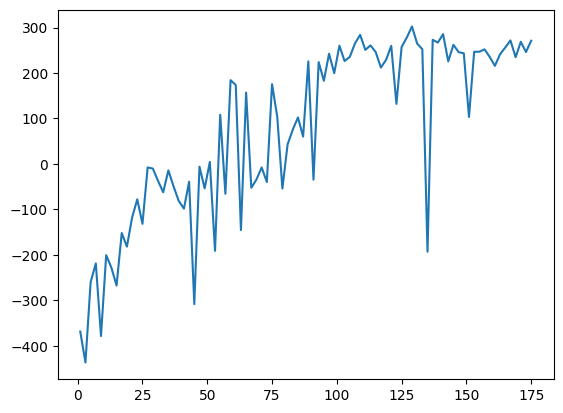

In [1]:
import gym
import random
from keras import Sequential
from collections import deque
from keras.layers import Dense
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from keras.activations import relu, linear

import numpy as np
env = gym.make('LunarLander-v2')
env.seed(0)
np.random.seed(0)


class DQN:

    def __init__(self, action_space, state_space):

        self.action_space = action_space
        self.state_space = state_space
        self.epsilon = 1.0
        self.gamma = .99
        self.batch_size = 64
        self.epsilon_min = .01
        self.lr = 0.001
        self.epsilon_decay = .996
        self.memory = deque(maxlen=1000000)
        self.model = self.build_model()

    def build_model(self):

        model = Sequential()
        model.add(Dense(150, input_dim=self.state_space, activation=relu))
        model.add(Dense(120, activation=relu))
        model.add(Dense(self.action_space, activation=linear))
        model.compile(loss='mse', optimizer=Adam(lr=self.lr))
        return model

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def act(self, state):

        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_space)
        act_values = self.model.predict(state)
        return np.argmax(act_values[0])

    def replay(self):

        if len(self.memory) < self.batch_size:
            return

        minibatch = random.sample(self.memory, self.batch_size)
        states = np.array([i[0] for i in minibatch])
        actions = np.array([i[1] for i in minibatch])
        rewards = np.array([i[2] for i in minibatch])
        next_states = np.array([i[3] for i in minibatch])
        dones = np.array([i[4] for i in minibatch])

        states = np.squeeze(states)
        next_states = np.squeeze(next_states)

        targets = rewards + self.gamma*(np.amax(self.model.predict_on_batch(next_states), axis=1))*(1-dones)
        targets_full = self.model.predict_on_batch(states)
        ind = np.array([i for i in range(self.batch_size)])
        targets_full[[ind], [actions]] = targets

        self.model.fit(states, targets_full, epochs=1, verbose=0)
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay


def train_dqn(episode):

    loss, avg_array, fuel_array = [], [], []
    agent = DQN(env.action_space.n, env.observation_space.shape[0])
    for e in range(episode):
        state = env.reset()
        state = np.reshape(state, (1, 8))
        score = 0
        max_steps = 1000
        for i in range(max_steps):
            action = agent.act(state)
            env.render()
            next_state, reward, done, _ = env.step(action)
            score += reward
            next_state = np.reshape(next_state, (1, 8))
            agent.remember(state, action, reward, next_state, done)
            fuel_array.append(abs(action))
            state = next_state
            agent.replay()
            if done:
                print("episode: {}/{}, score: {}".format(e, episode, score))
                break
        loss.append(score)

        # Average score of last 100 episode
        is_solved = np.mean(loss[-100:])
        avg_array.append(is_solved)
        if is_solved > 200:
            self.model.save('DQN_MODEL_WEIGHT.h5')
            print('\n Task Completed! \n')
            break
        print("Average over last 100 episode: {0:.2f} \n".format(is_solved))
    return loss, avg_array, fuel_array


if __name__ == '__main__':

    print(env.observation_space)
    print(env.action_space)
    episodes = 400
    loss, avg_array, fuel_array = train_dqn(episodes)
    plt.plot([i+1 for i in range(0, len(loss), 2)], loss[::2])
    plt.show()

Text(0, 0.5, 'Score')

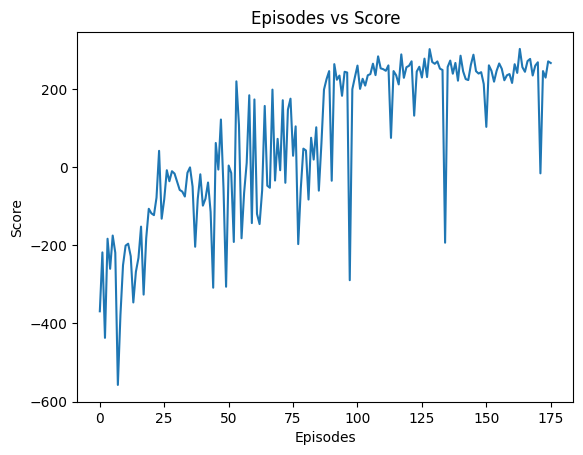

In [2]:
plt.plot(loss)
plt.title('Episodes vs Score')
plt.xlabel('Episodes')
plt.ylabel('Score')

Text(0, 0.5, 'Average Score')

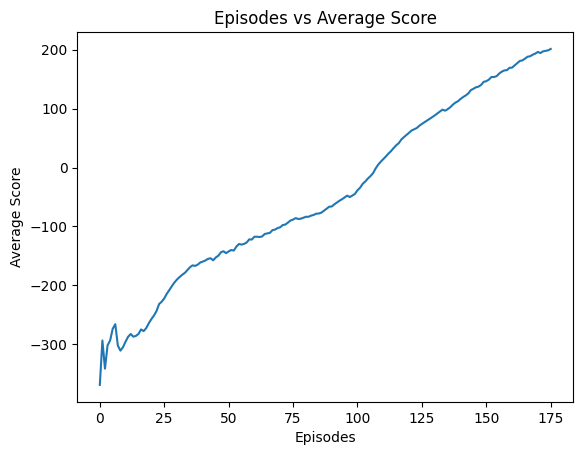

In [3]:
plt.plot(avg_array)
plt.title('Episodes vs Average Score')
plt.xlabel('Episodes')
plt.ylabel('Average Score')

## Double Deep Q Network 

__Double Deep Q Network__ <br><br>
Double DQN uses two identical network models. One learns during the Experience Replay (like DQN) and the other is a copy of the last episode of the first model. <br><br> 

__Q-Value Computation__<br><br>
The Q-Value is computed using the second model. In DQN, Q-Value is calculated by adding reward to the next state maximum Q-Value. As a result, if the Q-Value computed for a specific state is high the value obtained from the output of the neural network for that specific state becomes higher every time.<br>

To reduce the difference in output values, the use of a secondary model is implemented. Since the secondary model is a copy of the main model from the last episode, difference between values are lower than the main model and hence is used to obtain the Q-Value

In [1]:
import numpy as np
import gym
from keras.layers import Dense, Activation
from keras.models import Sequential, load_model
import keras
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

!pip3 install box2d-py
!pip3 install gym[Box_2D]

env = gym.make('LunarLander-v2')

class replayBuffer:
    def __init__(self,maxSize,stateDim):
        self.state=np.zeros((maxSize,stateDim))
        self.action=np.zeros(maxSize,dtype= np.int8)
        self.reward=np.zeros(maxSize)
        self.done=np.zeros(maxSize,)
        self.nextState=np.zeros((maxSize,stateDim))
        self.maxSize=maxSize
        self.curser=0
        self.size=0

    def save(self,state,action,reward,nextState,done):
        self.state[self.curser]=state
        self.action[self.curser]=action
        self.reward[self.curser]=reward
        self.nextState[self.curser]=nextState
        self.done[self.curser]=done
        self.curser=(self.curser+1)%self.maxSize
        if self.size<self.maxSize:
            self.size+=1 

    def sample(self,batchSize):
        batchSize=min(self.size,batchSize-1)
        indexes=np.random.choice([i for i in range(self.size-1)],batchSize)
        return self.state[indexes],self.action[indexes],self.reward[indexes],self.nextState[indexes],self.done[indexes]

class Agent:
    def __init__(self,stateShape,actionShape,exploreRate,exploreRateDecay,minimumExploreRate,gamma,copyNetsCycle):
        self.gamma=gamma
        self.exploreRate=exploreRate
        self.exploreRateDecay=exploreRateDecay
        self.minimumExploreRate=minimumExploreRate
        self.actionShape=actionShape
        self.memory=replayBuffer(1000000,stateShape)
        self.model=self.buildModel(stateShape,actionShape)
        self.model.compile(optimizer='Adam',loss='mse')
        self.tModel=self.buildModel(stateShape,actionShape)
        self.tModel.compile(optimizer='Adam',loss='mse')
        self.learnThreshold=0
        self.copyNetsCycle=copyNetsCycle

    def buildModel(self,input,output):
        inputLayer=keras.Input(shape=(input,))
        layer=Dense(256,activation='relu')(inputLayer)
        layer=Dense(256,activation='relu')(layer)
        outputLayer=Dense(output)(layer)
        model=keras.Model(inputs=inputLayer,outputs=outputLayer)
        model.compile(optimizer='Adam',loss='mse')
        return model
    
    def getAction(self,state):
        q=self.model.predict(np.expand_dims(state,axis=0))[0]
        if np.random.random()<=self.exploreRate:
            return np.random.choice([i for i in range(env.action_space.n)])
        else:
            return np.argmax(q)

    def exploreDecay(self):
        self.exploreRate=max(self.exploreRate*self.exploreRateDecay,self.minimumExploreRate)

    def saveModel(self,modelName="DoubleDQN_LunarLanderV2.h"):
        self.model.save_weights(f"{modelName}")

    def loadModel(self,modelName="DoubleDQN_LunarLanderV2.h"):
        self.model.load_weights(f"{modelName}")
        self.tModel.set_weights(self.model.get_weights())
    
    def learn(self,batchSize=64):
        if self.memory.size>batchSize:
            states,actions,rewards,nextStates,done=self.memory.sample(batchSize)
            qState=self.model.predict(states)
            qNextState=self.model.predict(nextStates)
            qNextStateTarget=self.tModel.predict(nextStates)
            maxActions=np.argmax(qNextState,axis=1)
            batchIndex = np.arange(batchSize-1, dtype=np.int32)
            qState[batchIndex,actions]=(rewards+(self.gamma*qNextStateTarget[batchIndex,maxActions.astype(int)]*(1-done)))
            _=self.model.fit(x=states,y=qState,verbose=0)
            self.learnThreshold+=1
            self.exploreDecay()
        if(self.learnThreshold%self.copyNetsCycle)==0:
            self.tModel.set_weights(self.model.get_weights())
            self.saveModel()
            self.learnThreshold=0

agent=Agent(stateShape=env.observation_space.shape[0],actionShape=env.action_space.n\
            ,exploreRate=1.0,exploreRateDecay=0.9995,minimumExploreRate=0.01,gamma=0.99,copyNetsCycle=100)

averageRewards, totalRewards, fuel_array = [], [], []
successCount = 0
for i in range(1,200):
    done=False
    state=env.reset()
    rewards=0
    while not done:
        action=agent.getAction(state)
        nextState,reward,done,info=env.step(action)
        agent.memory.save(state,action,reward,nextState,int(done))
        rewards+=reward
        state=nextState
        agent.learn(batchSize=128)
        if rewards >= 200:
            successCount += 1
        fuel_used = abs(action)
        fuel_array.append(fuel_used)
    totalRewards.append(rewards)
    averageRewards.append(sum(totalRewards)/len(totalRewards))
    print(f"episode: {i}   reward: {rewards}  avg so far:{averageRewards[-1]} exploreRate:{agent.exploreRate}")

  Using cached box2d-py-2.3.8.tar.gz (374 kB)
  Running setup.py clean for box2d-py
Failed to build box2d-py
    Running setup.py install for box2d-py: started
    Running setup.py install for box2d-py: finished with status 'error'


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\rutsm\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\rutsm\\AppData\\Local\\Temp\\pip-install-d6wfwhkm\\box2d-py_e7d28e6fccfd499f87b2e9b864ef41df\\setup.py'"'"'; __file__='"'"'C:\\Users\\rutsm\\AppData\\Local\\Temp\\pip-install-d6wfwhkm\\box2d-py_e7d28e6fccfd499f87b2e9b864ef41df\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\rutsm\AppData\Local\Temp\pip-wheel-t6q8v7p2'
       cwd: C:\Users\rutsm\AppData\Local\Temp\pip-install-d6wfwhkm\box2d-py_e7d28e6fccfd499f87b2e9b864ef41df\
  Complete output (28 lines):
  Using setuptools (version 58.0.4).
  running bdist_wheel
  running build
  running build_py
  creating build


1/1 [==============================] - 0s 17ms/step
episode: 1   reward: -71.50841694482826  avg so far:-71.50841694482826 exploreRate:1.0
4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 1ms/step
episode: 2   reward: -213.06156280004063  avg so far:-142.28498987243444 exploreRate:0.9675305747671379
4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 3ms/step
episode: 3   reward: -192.98757486273686  avg so far:-159.18585153586858 exploreRate:0.9098062330323018
4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 1ms/step
episode: 4   reward: -77.49207798191608  avg so far:-138.76240814738046 exploreRate:0.8815870670930053
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 1ms/step
episode: 5   reward: -76.16597783506472  avg so far:-126.2431220849173 exploreRate:0.8331466180706267
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step
episode: 6   reward: -186.6826432661199  avg so far:-136.31637561511775 exploreRate:0.773705362567126
1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 7   reward: -349.3327669832943  avg so far:-166.7472886677144 exploreRate:0.7381738593872831
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 1ms/step
episode: 8   reward: -164.84268911255046  avg so far:-166.5092137233189 exploreRate:0.6899799216113385
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 9   reward: -239.96691654401866  avg so far:-174.67118070339666 exploreRate:0.6430000919098481
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 10   reward: -267.00902617496183  avg so far:-183.90496525055318 exploreRate:0.6082773754464013
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step
episode: 11   reward: -98.32532505810758  avg so far:-176.12499796033086 exploreRate:0.5832526672941704
4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
episode: 12   reward: -97.36632397483888  avg so far:-169.56177512820653 exploreRate:0.5481807009649626
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 13   reward: -93.74284744000532  avg so far:-163.7295499214218 exploreRate:0.4886156649965242
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 1ms/step
episode: 14   reward: -51.67416139468482  avg so far:-155.72559359808344 exploreRate:0.4640829649433082
4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 2ms/step
episode: 15   reward: -86.82425309342621  avg so far:-151.13217089777297 exploreRate:0.4048550912185404
1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 1ms/step
episode: 16   reward: -107.85586328615969  avg so far:-148.42740167204713 exploreRate:0.3891711905425106
1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 1ms/step
episode: 17   reward: -207.07174172047374  avg so far:-151.87706873371928 exploreRate:0.36430914980491247
1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step
episode: 18   reward: -66.75378744324077  avg so far:-147.14799755091494 exploreRate:0.3327795262194029
1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 1ms/step
episode: 19   reward: -78.25143241491777  avg so far:-143.52186254375718 exploreRate:0.2785049052845831
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 20   reward: -84.20429825170773  avg so far:-140.5559843291547 exploreRate:0.26624699183590983
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 2ms/step
episode: 21   reward: -59.30489028665768  avg so far:-136.68688461284532 exploreRate:0.2532588060086049
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 1ms/step
episode: 22   reward: -175.90339618214682  avg so far:-138.46945332054085 exploreRate:0.19634008207839593
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 1ms/step
episode: 23   reward: -234.27172797837048  avg so far:-142.63476961001172 exploreRate:0.14199150633873392
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 24   reward: -74.4309830956491  avg so far:-139.79294517191326 exploreRate:0.1337205582477425
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 1ms/step
episode: 25   reward: -440.5071848020532  avg so far:-151.82151475711885 exploreRate:0.11972825127876882
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 26   reward: -197.03923221998804  avg so far:-153.56065773645997 exploreRate:0.1080613334818023
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 1ms/step
episode: 27   reward: -131.98621368515643  avg so far:-152.7616042530784 exploreRate:0.10439589352902491
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 28   reward: -60.534380336854824  avg so far:-149.46777482749897 exploreRate:0.10065322694439105
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 1ms/step
episode: 29   reward: -119.70082337248508  avg so far:-148.44132822560195 exploreRate:0.09782440494667557
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 30   reward: -12.982791721514715  avg so far:-143.9260436754657 exploreRate:0.09111808742815397
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 31   reward: 16.29739050033922  avg so far:-138.75754579882684 exploreRate:0.08453262656804164
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 32   reward: -157.98846493702257  avg so far:-139.35851202189545 exploreRate:0.07846235392003083
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 33   reward: -74.83605185470208  avg so far:-137.40328595622293 exploreRate:0.07333969920327496
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 34   reward: -43.07909235792211  avg so far:-134.62904496803762 exploreRate:0.06872312876496313
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 12ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 4ms/step
episode: 35   reward: -10.917632491248767  avg so far:-131.0944331829865 exploreRate:0.06119446817558698
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 36   reward: -27.222409150805234  avg so far:-128.2090991820926 exploreRate:0.053759715832623546
1/1 [==============================] - 0s 13ms/step


4/4 [==============================] - 0s 2ms/step
episode: 37   reward: -130.29108327325062  avg so far:-128.26536902239414 exploreRate:0.05147074210281617
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 38   reward: -79.24729636300042  avg so far:-126.9754197418838 exploreRate:0.04530791068694824
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 39   reward: -89.57538172025535  avg so far:-126.0164444079959 exploreRate:0.043749181023971954
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 40   reward: -189.98327563209364  avg so far:-127.61561518859835 exploreRate:0.04091333862334914
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 1ms/step
episode: 41   reward: -193.591716287039  avg so far:-129.2247883861213 exploreRate:0.03789946539111403
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step
episode: 42   reward: -429.2638456303738  avg so far:-136.3685754633654 exploreRate:0.031121152721103055
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 43   reward: -33.64412244709118  avg so far:-133.97963469554506 exploreRate:0.02948478109935427
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 44   reward: -216.9959748232029  avg so far:-135.8663696984464 exploreRate:0.02753222411256135
4/4 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
episode: 45   reward: -93.152504895353  avg so far:-134.91717270282209 exploreRate:0.024066563448213042
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 4ms/step
episode: 46   reward: 174.73340583909015  avg so far:-128.18563838669357 exploreRate:0.017650179309798217
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 47   reward: -34.0193353966745  avg so far:-126.1821000252038 exploreRate:0.010704036366419568
4/4 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 48   reward: -95.79267183560945  avg so far:-125.54898693792057 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 49   reward: -33.02677908154888  avg so far:-123.66077861432115 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 50   reward: -61.08107178299348  avg so far:-122.4091844776946 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 51   reward: -82.8045148202143  avg so far:-121.63262232754794 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 52   reward: -65.1839556303733  avg so far:-120.54707104490996 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 5ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 53   reward: -146.14783892634452  avg so far:-121.03010440116344 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 54   reward: 15.817238246285129  avg so far:-118.4958943521366 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 55   reward: -119.74051539197  avg so far:-118.51852382558812 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 56   reward: -66.79593615933874  avg so far:-117.59490618869081 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 57   reward: -108.7490793067337  avg so far:-117.43971624339332 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 58   reward: -167.98627203387647  avg so far:-118.31120858460854 exploreRate:0.01


4/4 [==============================] - 0s 5ms/step


4/4 [==============================] - 0s 2ms/step
episode: 59   reward: -40.06016276321482  avg so far:-116.98491967238152 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 60   reward: -425.25859786028957  avg so far:-122.12281430884666 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 4ms/step
episode: 61   reward: -85.03851220646168  avg so far:-121.51487493011903 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 62   reward: -46.88163048291436  avg so far:-120.31111292290605 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 63   reward: -58.610272591313674  avg so far:-119.33173450494427 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step
episode: 64   reward: -51.314221363207764  avg so far:-118.26896086210463 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 65   reward: 286.08730139469117  avg so far:-112.04809528892316 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 66   reward: -45.09549848628966  avg so far:-111.03366200403477 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step
episode: 67   reward: -99.44261807442652  avg so far:-110.86066134836898 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 5ms/step
episode: 68   reward: -120.17548797652418  avg so far:-110.99764409290067 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 69   reward: -58.42414065027302  avg so far:-110.23570926039882 exploreRate:0.01
1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 5ms/step
episode: 70   reward: -431.2290468905795  avg so far:-114.8213283694014 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 2ms/step
episode: 71   reward: -624.1616429828689  avg so far:-121.9951356174784 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 72   reward: -83.12771302579976  avg so far:-121.45531030370509 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 73   reward: 3.5923950687976998  avg so far:-119.74232803832835 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 74   reward: -404.84472978739495  avg so far:-123.59506319709952 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 75   reward: -284.0011180534261  avg so far:-125.73381059518387 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 76   reward: -312.48594472706304  avg so far:-128.19107551797174 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 77   reward: -63.97426314657178  avg so far:-127.35709094171982 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 78   reward: -38.02203807525056  avg so far:-126.21176975112405 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 79   reward: -364.0529789105349  avg so far:-129.2224179683318 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step
episode: 80   reward: -226.36027351679138  avg so far:-130.43664116268752 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 81   reward: -16.32225948964492  avg so far:-129.02782163585985 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step
episode: 82   reward: -304.23591088221525  avg so far:-131.1645056510593 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 83   reward: -43.6712406566451  avg so far:-130.11036992823503 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 84   reward: -130.38324294883412  avg so far:-130.1136184165755 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 85   reward: -307.84938688649027  avg so far:-132.20462745739803 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 86   reward: -224.92293411432757  avg so far:-133.28274730224604 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step
episode: 87   reward: -51.80488817387577  avg so far:-132.346220185828 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 88   reward: -329.4033318419953  avg so far:-134.58550554555717 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 89   reward: -258.90499390454653  avg so far:-135.98235372936605 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 90   reward: -190.33322953106347  avg so far:-136.5862523493849 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 91   reward: -101.12209655538608  avg so far:-136.19653635164863 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 92   reward: -96.38587777369398  avg so far:-135.76381180188827 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 93   reward: -189.69178362143884  avg so far:-136.3436824666146 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 94   reward: -268.4991521176356  avg so far:-137.74959171822124 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 95   reward: -488.37986201545584  avg so far:-141.44043666871843 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 96   reward: -334.66675494893997  avg so far:-143.45321081747073 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 97   reward: -271.38607687544686  avg so far:-144.77210634384164 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 98   reward: -262.4439419260509  avg so far:-145.9728393599866 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 99   reward: -330.9653077365905  avg so far:-147.8414501516695 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 100   reward: -316.65738561694525  avg so far:-149.52960950632226 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 101   reward: -83.79010800676876  avg so far:-148.87872335286133 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 102   reward: -181.76598160167882  avg so far:-149.20114745333993 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 103   reward: -122.59353113739095  avg so far:-148.9428210813404 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 104   reward: -343.0969671237204  avg so far:-150.80968787020944 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 105   reward: -136.5300248413599  avg so far:-150.6736910794585 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 106   reward: -212.05811319894394  avg so far:-151.25278940134044 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 107   reward: -316.28936398742263  avg so far:-152.79518729466832 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 108   reward: -75.00357481327487  avg so far:-152.07489458650727 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 109   reward: -171.455367343454  avg so far:-152.25269708886458 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 110   reward: -608.859580875343  avg so far:-156.40366875965074 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step
episode: 111   reward: -31.38254336443896  avg so far:-155.27735231464882 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 112   reward: -627.7165203387316  avg so far:-159.4955591720067 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 113   reward: -208.7665861292303  avg so far:-159.93158595923873 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 114   reward: -213.57939538342595  avg so far:-160.40218077874914 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 115   reward: -261.7908672263166  avg so far:-161.28382153046715 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step
episode: 116   reward: -149.906851187924  avg so far:-161.18574419992797 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 117   reward: -649.1159156182056  avg so far:-165.35608754538333 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 118   reward: -228.35679575390526  avg so far:-165.8899918522352 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 119   reward: -226.22310960754936  avg so far:-166.39699284177564 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 120   reward: -397.24982463968223  avg so far:-168.32076644009155 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 121   reward: -557.5968737813562  avg so far:-171.53792435200282 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step
episode: 122   reward: -523.2561114123716  avg so far:-174.42086031151405 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 123   reward: -507.72921324205583  avg so far:-177.13068431907942 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 124   reward: -604.4029851720214  avg so far:-180.5764286807967 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 125   reward: -575.9534052397414  avg so far:-183.73944449326828 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 126   reward: -458.40828609885887  avg so far:-185.91935593458248 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 127   reward: -572.1557282336778  avg so far:-188.9605872125281 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 2ms/step
episode: 128   reward: -571.7151105346832  avg so far:-191.95085692598244 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 129   reward: -390.3901467834991  avg so far:-193.48914599464536 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 130   reward: -424.8960932228763  avg so far:-195.26919943486251 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 131   reward: -587.4426744357024  avg so far:-198.26289008372387 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 132   reward: -588.163863929502  avg so far:-201.21668534013128 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 133   reward: -450.6835530444406  avg so far:-203.09237607475015 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 134   reward: -457.1407252578468  avg so far:-204.98825927760907 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 135   reward: -412.13863598459915  avg so far:-206.52270651247568 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 136   reward: -484.84264646814904  avg so far:-208.56917665920858 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 137   reward: -550.7996667320948  avg so far:-211.06720943346323 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 138   reward: -331.48298417644094  avg so far:-211.9397875113109 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 139   reward: -535.7474231339418  avg so far:-214.26933884672547 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 140   reward: -495.48160309802927  avg so far:-216.27799787709193 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 141   reward: -549.7841725369253  avg so far:-218.643289895956 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 142   reward: -426.9004678502732  avg so far:-220.10988974070472 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step
episode: 143   reward: -369.55612430954096  avg so far:-221.15496830412314 exploreRate:0.01
1/1 [==============================] - 0s 14ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 144   reward: -521.5049664952755  avg so far:-223.24073218045058 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 145   reward: -334.6523715258668  avg so far:-224.00908831386724 exploreRate:0.01
1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step
episode: 146   reward: -535.6887320185177  avg so far:-226.14388039403607 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 147   reward: -537.4369987709636  avg so far:-228.26152065510362 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step
episode: 148   reward: -596.5811861436459  avg so far:-230.75016704353973 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 149   reward: -624.2901037507595  avg so far:-233.39137467244726 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 150   reward: -612.6172054363963  avg so far:-235.91954687754026 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step
episode: 151   reward: -383.89160520102746  avg so far:-236.89949428365605 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 152   reward: -356.13085689302454  avg so far:-237.68391114292822 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 153   reward: -314.8430833725875  avg so far:-238.18821945815475 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 154   reward: -412.63893527898966  avg so far:-239.32101631413423 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 155   reward: -526.3549823167868  avg so far:-241.172848352861 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 156   reward: -476.20444676146076  avg so far:-242.67946116317253 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 157   reward: -208.1763231028666  avg so far:-242.45969595259734 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step
episode: 158   reward: -543.7545224881643  avg so far:-244.366625234468 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 159   reward: -443.8690354164386  avg so far:-245.62135737397722 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 160   reward: -334.5056596277668  avg so far:-246.1768842630634 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 161   reward: -58.5647459843037  avg so far:-245.01159147872326 exploreRate:0.01
4/4 [==============================] - 0s 4ms/step


4/4 [==============================] - 0s 3ms/step
episode: 162   reward: -371.4597395429991  avg so far:-245.7921356025768 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 163   reward: -487.8098293460933  avg so far:-247.27690672983763 exploreRate:0.01
1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 2ms/step
episode: 164   reward: -509.3936741249471  avg so far:-248.87517970175907 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 165   reward: -397.2935283198782  avg so far:-249.77468484489916 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 166   reward: -349.8930989543916  avg so far:-250.37780782146237 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 167   reward: -274.3105853643604  avg so far:-250.52111786662942 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 168   reward: -256.89674580922815  avg so far:-250.55906803295443 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 169   reward: -351.13086612423  avg so far:-251.1541674299442 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step
episode: 170   reward: -240.04073604186237  avg so far:-251.08879430413197 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 171   reward: -382.75755458971355  avg so far:-251.85878705434004 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 15ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 172   reward: -60.75367565110976  avg so far:-250.7477108252515 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 173   reward: -337.78675238317396  avg so far:-251.2508266724071 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 174   reward: -283.6971456511315  avg so far:-251.43729976998597 exploreRate:0.01
4/4 [==============================] - 0s 5ms/step


4/4 [==============================] - 0s 2ms/step
episode: 175   reward: -163.06143648305545  avg so far:-250.9322948369178 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 176   reward: -229.64191398249895  avg so far:-250.81132676388134 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 177   reward: -69.24330159224509  avg so far:-249.78551871206417 exploreRate:0.01
1/1 [==============================] - 0s 21ms/step


4/4 [==============================] - 0s 3ms/step
episode: 178   reward: -209.5575331788146  avg so far:-249.55951879333804 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 179   reward: -168.5457186507578  avg so far:-249.10692773108897 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 180   reward: -286.3305645822808  avg so far:-249.31372571359563 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 181   reward: -354.02193377074104  avg so far:-249.89222410065167 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step
episode: 182   reward: -305.00895004406755  avg so far:-250.19506325418692 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 183   reward: -565.9625527889618  avg so far:-251.92056866148073 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 184   reward: -673.4953833186181  avg so far:-254.21173613244343 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 185   reward: -130.1216806869798  avg so far:-253.54097907598145 exploreRate:0.01
4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 186   reward: -462.19228040515975  avg so far:-254.66276026592325 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 187   reward: -340.2613665550724  avg so far:-255.12050682361925 exploreRate:0.01
1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 188   reward: -197.93912423268483  avg so far:-254.81635053324192 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 189   reward: -494.3591636019033  avg so far:-256.0837728246105 exploreRate:0.01
1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step
episode: 190   reward: -927.1809086586267  avg so far:-259.6158630132106 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 191   reward: -1164.0110976372748  avg so far:-264.3509165976298 exploreRate:0.01
1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 192   reward: -456.1683620156644  avg so far:-265.3499657925154 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step
episode: 193   reward: -874.9786497440016  avg so far:-268.5086636368236 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
episode: 194   reward: -208.0282411596412  avg so far:-268.19690888178656 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 195   reward: -1211.5256869677037  avg so far:-273.03449235915025 exploreRate:0.01
1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 16ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step
episode: 196   reward: -510.9747690896989  avg so far:-274.2484733628775 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 197   reward: -150.71853161280586  avg so far:-273.621417820999 exploreRate:0.01
1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step
episode: 198   reward: -238.4573048904091  avg so far:-273.4438212910465 exploreRate:0.01
4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
episode: 199   reward: -127.71180297486833  avg so far:-272.7114995909652 exploreRate:0.01


Text(0, 0.5, 'Average Score')

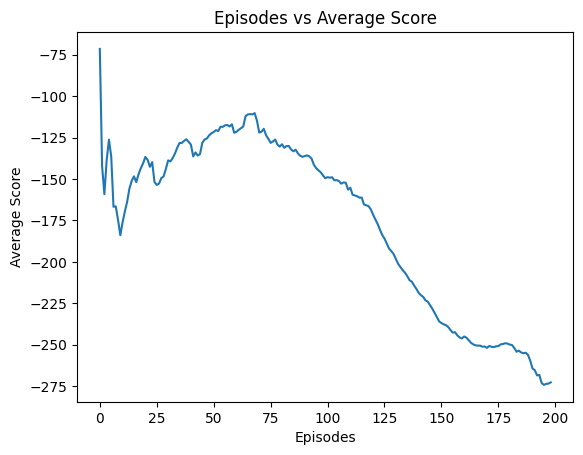

In [2]:
plt.plot(averageRewards)
plt.title('Episodes vs Average Score')
plt.xlabel('Episodes')
plt.ylabel('Average Score')

Text(0, 0.5, 'Score')

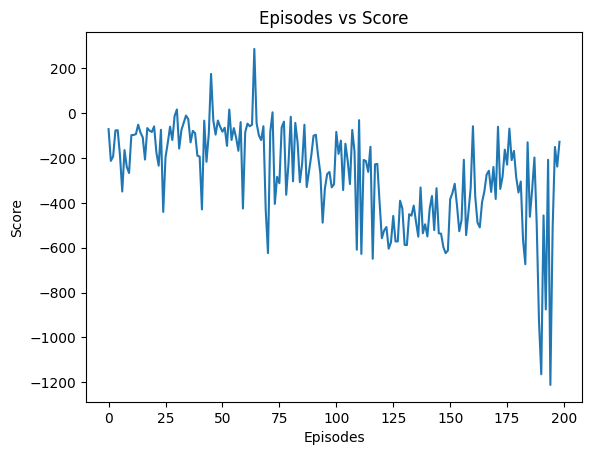

In [3]:
plt.plot(totalRewards)
plt.title('Episodes vs Score')
plt.xlabel('Episodes')
plt.ylabel('Score')

## Dueling Deep Q Network 

__Dueling Deep Q Network__ <br><br>
The difference in a Dueling DQN lies in its architecture and output. It is formed in a way to produce the formula below: <br>
$$
Q(s.a) = V(s) + A(s.a)
$$
<br>
In the above formula, V(s) refers to the Value of State S and A refers to the Advantage of performing an action while in state s. <br>

It is important to note that the value of a state is independent of action. This refers to how good an action is in a particular state. <br><br><br>

__What Is Advantage?__ <br><br>
The agent could be in a state where all actions produce the same Q-Value, meaning there is no good action in this state. If the mean of all Advantages is subtracted from each advantage, we get a value very close or equal to 0, where the Q-Value would be the Value that the state possesses. <br>
<br>$$
Q(s,a) = V(s) + A(s,a) - \frac{1}{n} \sum_{a'} A(s,a')
$$<br>

As a result, Q-Value will not overshoot, and the states that are independent odf action would not have a high Q-Value to train on.

In [1]:
from importlib import import_module
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
import numpy as np


class Agent():
    def __init__(self, lr, gamma, n_actions, epsilon, batch_size,
                 input_dims, epsilon_dec=1e-3, eps_end=0.01, 
                 mem_size=100000, fname='dueling_dqn.h5', fc1_dims=128,
                 fc2_dims=128, replace=100):
        self.action_space = [i for i in range(n_actions)]
        self.gamma = gamma
        self.epsilon = epsilon
        self.eps_dec = epsilon_dec
        self.eps_min = eps_end
        self.fname = fname
        self.replace = replace
        self.batch_size = batch_size

        self.learn_step_counter = 0
        self.memory = ReplayBuffer(mem_size, input_dims)
        self.q_eval = DuelingDeepQNetwork(n_actions, fc1_dims, fc2_dims)
        self.q_next = DuelingDeepQNetwork(n_actions, fc1_dims, fc2_dims)

        self.q_eval.compile(optimizer=Adam(learning_rate=lr),
                            loss='mean_squared_error')
        # just a formality, won't optimize network
        self.q_next.compile(optimizer=Adam(learning_rate=lr),
                            loss='mean_squared_error')

    def store_transition(self, state, action, reward, new_state, done):
        self.memory.store_transition(state, action, reward, new_state, done)

    def choose_action(self, observation):
        if np.random.random() < self.epsilon:
            action = np.random.choice(self.action_space)
        else:
            state = np.array([observation])
            actions = self.q_eval.advantage(state)
            action = tf.math.argmax(actions, axis=1).numpy()[0]

        return action

    def learn(self):
        if self.memory.mem_cntr < self.batch_size:
            return

        if self.learn_step_counter % self.replace == 0:
            self.q_next.set_weights(self.q_eval.get_weights())

        states, actions, rewards, states_, dones = \
                                    self.memory.sample_buffer(self.batch_size)

        q_pred = self.q_eval(states)
        q_next = tf.math.reduce_max(self.q_next(states_), axis=1, keepdims=True).numpy()
        q_target = np.copy(q_pred)

        # improve on my solution!
        for idx, terminal in enumerate(dones):
            if terminal:
                q_next[idx] = 0.0
            q_target[idx, actions[idx]] = rewards[idx] + self.gamma*q_next[idx]

        self.q_eval.train_on_batch(states, q_target)

        self.epsilon = self.epsilon - self.eps_dec if self.epsilon > \
                        self.eps_min else self.eps_min

        self.learn_step_counter += 1
        
import tensorflow as tf
import tensorflow.keras as keras


class DuelingDeepQNetwork(keras.Model):
    def __init__(self, n_actions, fc1_dims, fc2_dims):
        super(DuelingDeepQNetwork, self).__init__()
        self.dense1 = keras.layers.Dense(fc1_dims, activation='relu')
        self.dense2 = keras.layers.Dense(fc2_dims, activation='relu')
        self.V = keras.layers.Dense(1, activation=None)
        self.A = keras.layers.Dense(n_actions, activation=None)

    def call(self, state):
        x = self.dense1(state)
        x = self.dense2(x)
        V = self.V(x)
        A = self.A(x)

        Q = (V + (A - tf.math.reduce_mean(A, axis=1, keepdims=True)))

        return Q
    
    def advantage(self, state):
        x = self.dense1(state)
        x = self.dense2(x)
        A = self.A(x)

        return A
    

import numpy as np

class ReplayBuffer():
    def __init__(self, max_size, input_shape):
        self.mem_size = max_size
        self.mem_cntr = 0

        self.state_memory = np.zeros((self.mem_size, *input_shape),
                                        dtype=np.float32)
        self.new_state_memory = np.zeros((self.mem_size, *input_shape),
                                        dtype=np.float32)
        self.action_memory = np.zeros(self.mem_size, dtype=np.int32)
        self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
        self.terminal_memory = np.zeros(self.mem_size, dtype=np.bool)

    def store_transition(self, state, action, reward, state_, done):
        index = self.mem_cntr % self.mem_size
        self.state_memory[index] = state
        self.new_state_memory[index] = state_
        self.action_memory[index] = action
        self.reward_memory[index] = reward
        self.terminal_memory[index] = done

        self.mem_cntr += 1

    def sample_buffer(self, batch_size):
        max_mem = min(self.mem_cntr, self.mem_size)
        batch = np.random.choice(max_mem, batch_size, replace=False)

        states = self.state_memory[batch]
        new_states = self.new_state_memory[batch]
        actions = self.action_memory[batch]
        rewards = self.reward_memory[batch]
        dones = self.terminal_memory[batch]

        return states, actions, rewards, new_states, dones
    
import numpy as np
import gym

if __name__ == '__main__':
    env = gym.make('LunarLander-v2')
    n_games = 400
    agent = Agent(gamma=0.99, epsilon=1, lr=1e-3, input_dims=[8], 
                  epsilon_dec=1e-3, mem_size=100000, batch_size=64, eps_end=0.01,
                  fc1_dims=128, fc2_dims=128, replace=100, n_actions=4)

    scores, eps_history, avg_array = [], [], []

    for i in range(n_games):
        done = False
        score = 0
        observation = env.reset()
        while not done:
            action = agent.choose_action(observation)
            observation_, reward, done, info = env.step(action)
            score += reward
            agent.store_transition(observation, action, reward, observation_, done)
            observation = observation_
            agent.learn()
        eps_history.append(agent.epsilon)
        scores.append(score)

        avg_score = np.mean(scores[-100:])
        avg_array.append(avg_score)
        print('episode ', i, 'score %.1f' % score,
                'average score %.1f' % avg_score,
                'epsilon %.2f' % agent.epsilon)

C:\Users\rutsm\AppData\Local\Temp\ipykernel_14312\7220028.py:115: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  self.terminal_memory = np.zeros(self.mem_size, dtype=np.bool)


episode  0 score -145.4 average score -145.4 epsilon 0.96
episode  1 score -49.1 average score -97.2 epsilon 0.89
episode  2 score -172.1 average score -122.2 epsilon 0.81
episode  3 score -241.3 average score -152.0 epsilon 0.66
episode  4 score -13.3 average score -124.2 epsilon 0.50
episode  5 score -238.4 average score -143.3 epsilon 0.36
episode  6 score -193.2 average score -150.4 epsilon 0.26
episode  7 score -199.1 average score -156.5 epsilon 0.08
episode  8 score -95.0 average score -149.7 epsilon 0.01
episode  9 score -15.6 average score -136.2 epsilon 0.01
episode  10 score -268.3 average score -148.2 epsilon 0.01
episode  11 score -388.8 average score -168.3 epsilon 0.01
episode  12 score -53.2 average score -159.4 epsilon 0.01
episode  13 score -474.3 average score -181.9 epsilon 0.01
episode  14 score 10.1 average score -169.1 epsilon 0.01
episode  15 score -135.0 average score -167.0 epsilon 0.01
episode  16 score 22.0 average score -155.9 epsilon 0.01
episode  17 score

episode  143 score 250.1 average score 59.5 epsilon 0.01
episode  144 score 277.5 average score 62.3 epsilon 0.01
episode  145 score 217.9 average score 64.5 epsilon 0.01
episode  146 score 250.5 average score 69.2 epsilon 0.01
episode  147 score 260.2 average score 73.0 epsilon 0.01
episode  148 score 253.4 average score 76.0 epsilon 0.01
episode  149 score 203.5 average score 76.1 epsilon 0.01
episode  150 score -73.9 average score 75.6 epsilon 0.01
episode  151 score 103.8 average score 80.0 epsilon 0.01
episode  152 score 215.5 average score 82.4 epsilon 0.01
episode  153 score -23.8 average score 82.4 epsilon 0.01
episode  154 score 230.8 average score 85.0 epsilon 0.01
episode  155 score 232.4 average score 87.4 epsilon 0.01
episode  156 score 213.4 average score 90.0 epsilon 0.01
episode  157 score 267.3 average score 93.3 epsilon 0.01
episode  158 score 245.0 average score 95.4 epsilon 0.01
episode  159 score 252.0 average score 98.2 epsilon 0.01
episode  160 score 241.7 averag

episode  285 score 260.2 average score 213.6 epsilon 0.01
episode  286 score 244.9 average score 213.5 epsilon 0.01
episode  287 score 271.9 average score 213.6 epsilon 0.01
episode  288 score 258.2 average score 213.5 epsilon 0.01
episode  289 score 259.1 average score 216.2 epsilon 0.01
episode  290 score 287.1 average score 216.4 epsilon 0.01
episode  291 score 251.9 average score 216.7 epsilon 0.01
episode  292 score 309.2 average score 217.6 epsilon 0.01
episode  293 score 254.8 average score 217.5 epsilon 0.01
episode  294 score 206.5 average score 217.3 epsilon 0.01
episode  295 score 286.9 average score 222.6 epsilon 0.01
episode  296 score 280.6 average score 223.1 epsilon 0.01
episode  297 score 250.8 average score 223.4 epsilon 0.01
episode  298 score 232.0 average score 223.4 epsilon 0.01
episode  299 score 252.5 average score 228.1 epsilon 0.01
episode  300 score 241.1 average score 228.5 epsilon 0.01
episode  301 score 282.1 average score 234.9 epsilon 0.01
episode  302 s

Text(0, 0.5, 'Score')

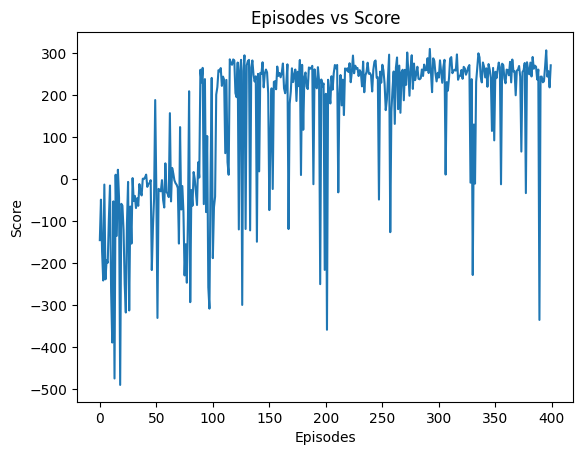

In [5]:
import matplotlib.pyplot as plt
plt.plot(scores)
plt.title('Episodes vs Score')
plt.xlabel('Episodes')
plt.ylabel('Score')

Text(0, 0.5, 'Average Score')

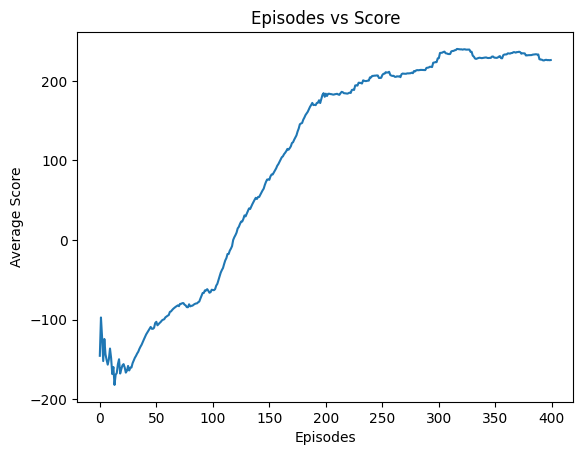

In [6]:
plt.plot(avg_array)
plt.title('Episodes vs Score')
plt.xlabel('Episodes')
plt.ylabel('Average Score')

## Dueling Deep Q Network With Prioritized Experience Replay (DQN-PER)

__Concept Behind DQN-PER__ <br><br>

In some instances, the batch chosen from the memory is not an elligible batch, meaning that the experience memories chosen are not significantly important to learn. In that case, the important experience memories have to be chosen for putting in the batch. <br><br>

__How To Identify Importance?__ <br><br>
If the Q-Value from the next state is vastly different as compared to the Q-Value from the current state, it means that the importance is high for whether the Q-Value in the next state increases or decreases. This is known as *Temporal Difference Error* <br>

The formula for Temporal Difference Error is listed as:
<br><br>$$
TD = |Q(s, a) - Q(s + 1,a)|
$$<br>

and the probability of an Experience Memory being chosen would be:
<br><br>$$
p_{i} = \frac{\left(\text{TD}_{i} + \epsilon\right)^{a}} {\sum_{k}^{memory\ size} \left(\text{TD}_{k} + \epsilon\right)^{a}}
$$<br>

In the formula above, epsilon is a small value to prevent division by 0 and alpha is a random value between 0 and 1. 1 refers to the most important memories and 0 means its random. Hence, p would be the probability that an experience is important and the batch will then get filled considering experience probabilities. <br><br>

__Prevention Of Overfitting__ <br><br>
Since the training of the network occurs stochastically, experiences with high probabilty would get chosen over and over, causing the network to overfit. In order to curb this issue, we multiply this value to the training loss: <br>
<br>$$
Importance = \left(\frac{1}{p_i}\cdot\frac{1}{\text{memory size}}\right)^b
$$<br>

In [1]:
import numpy as np
import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

np.random.seed(1)
tf.set_random_seed(1)


class SumTree(object):
    
    data_pointer = 0

    def __init__(self, capacity):
        self.capacity = capacity  # for all priority values
        self.tree = np.zeros(2 * capacity - 1)
        # [--------------Parent nodes-------------][-------leaves to recode priority-------]
        #             size: capacity - 1                       size: capacity
        self.data = np.zeros(capacity, dtype=object)  # for all transitions
        # [--------------data frame-------------]
        #             size: capacity

    def add_new_priority(self, p, data):
        leaf_idx = self.data_pointer + self.capacity - 1

        self.data[self.data_pointer] = data  # update data_frame
        self.update(leaf_idx, p)  # update tree_frame
        self.data_pointer += 1
        if self.data_pointer >= self.capacity:  # replace when exceed the capacity
            self.data_pointer = 0

    def update(self, tree_idx, p):
        change = p - self.tree[tree_idx]

        self.tree[tree_idx] = p
        self._propagate_change(tree_idx, change)

    def _propagate_change(self, tree_idx, change):
        """change the sum of priority value in all parent nodes"""
        parent_idx = (tree_idx - 1) // 2
        self.tree[parent_idx] += change
        if parent_idx != 0:
            self._propagate_change(parent_idx, change)

    def get_leaf(self, lower_bound):
        leaf_idx = self._retrieve(lower_bound)  # search the max leaf priority based on the lower_bound
        data_idx = leaf_idx - self.capacity + 1
        return [leaf_idx, self.tree[leaf_idx], self.data[data_idx]]

    def _retrieve(self, lower_bound, parent_idx=0):
        """
        Tree structure and array storage:

        Tree index:
             0         -> storing priority sum
            / \
          1     2
         / \   / \
        3   4 5   6    -> storing priority for transitions

        Array type for storing:
        [0,1,2,3,4,5,6]
        """
        left_child_idx = 2 * parent_idx + 1
        right_child_idx = left_child_idx + 1

        if left_child_idx >= len(self.tree):  # end search when no more child
            return parent_idx

        if self.tree[left_child_idx] == self.tree[right_child_idx]:
            return self._retrieve(lower_bound, np.random.choice([left_child_idx, right_child_idx]))
        if lower_bound <= self.tree[left_child_idx]:  # downward search, always search for a higher priority node
            return self._retrieve(lower_bound, left_child_idx)
        else:
            return self._retrieve(lower_bound - self.tree[left_child_idx], right_child_idx)

    @property
    def root_priority(self):
        return self.tree[0]  # the root


class Memory(object):  # stored as ( s, a, r, s_ ) in SumTree
    """
    This SumTree code is modified version and the original code is from:
    https://github.com/jaara/AI-blog/blob/master/Seaquest-DDQN-PER.py
    """
    epsilon = 0.001  # small amount to avoid zero priority
    alpha = 0.6  # [0~1] convert the importance of TD error to priority
    beta = 0.4  # importance-sampling, from initial value increasing to 1
    beta_increment_per_sampling = 1e-4  # annealing the bias
    abs_err_upper = 1   # for stability refer to paper

    def __init__(self, capacity):
        self.tree = SumTree(capacity)

    def store(self, error, transition):
        p = self._get_priority(error)
        self.tree.add_new_priority(p, transition)

    def sample(self, n):
        batch_idx, batch_memory, ISWeights = [], [], []
        segment = self.tree.root_priority / n
        self.beta = np.min([1, self.beta + self.beta_increment_per_sampling])  # max = 1

        min_prob = np.min(self.tree.tree[-self.tree.capacity:]) / self.tree.root_priority
        maxiwi = np.power(self.tree.capacity * min_prob, -self.beta)  # for later normalizing ISWeights
        for i in range(n):
            a = segment * i
            b = segment * (i + 1)
            lower_bound = np.random.uniform(a, b)
            idx, p, data = self.tree.get_leaf(lower_bound)
            prob = p / self.tree.root_priority
            ISWeights.append(self.tree.capacity * prob)
            batch_idx.append(idx)
            batch_memory.append(data)

        ISWeights = np.vstack(ISWeights)
        ISWeights = np.power(ISWeights, -self.beta) / maxiwi  # normalize
        return batch_idx, np.vstack(batch_memory), ISWeights

    def update(self, idx, error):
        p = self._get_priority(error)
        self.tree.update(idx, p)

    def _get_priority(self, error):
        error += self.epsilon   # avoid 0
        clipped_error = np.clip(error, 0, self.abs_err_upper)
        return np.power(clipped_error, self.alpha)


class DuelingDQNPrioritizedReplay:
    def __init__(
            self,
            n_actions,
            n_features,
            learning_rate=0.005,
            reward_decay=0.9,
            e_greedy=0.9,
            replace_target_iter=500,
            memory_size=10000,
            batch_size=32,
            e_greedy_increment=None,
            hidden=[100, 50],
            output_graph=False,
            sess=None,
    ):
        self.n_actions = n_actions
        self.n_features = n_features
        self.lr = learning_rate
        self.gamma = reward_decay
        self.epsilon_max = e_greedy
        self.replace_target_iter = replace_target_iter
        self.memory_size = memory_size
        self.batch_size = batch_size
        self.hidden = hidden
        self.epsilon_increment = e_greedy_increment
        self.epsilon = 0.5 if e_greedy_increment is not None else self.epsilon_max

        self.learn_step_counter = 0
        self._build_net()
        self.memory = Memory(capacity=memory_size)

        if sess is None:
            self.sess = tf.Session()
            self.sess.run(tf.global_variables_initializer())
        else:
            self.sess = sess

        if output_graph:
            tf.summary.FileWriter("logs/", self.sess.graph)

        self.cost_his = []

    def _build_net(self):
        def build_layers(s, c_names, w_initializer, b_initializer):
            for i, h in enumerate(self.hidden):
                if i == 0:
                    in_units, out_units, inputs = self.n_features, self.hidden[i], s
                else:
                    in_units, out_units, inputs = self.hidden[i-1], self.hidden[i], l
                with tf.variable_scope('l%i' % i):
                    w = tf.get_variable('w', [in_units, out_units], initializer=w_initializer, collections=c_names)
                    b = tf.get_variable('b', [1, out_units], initializer=b_initializer, collections=c_names)
                    l = tf.nn.relu(tf.matmul(inputs, w) + b)

            with tf.variable_scope('Value'):
                w = tf.get_variable('w', [self.hidden[-1], 1], initializer=w_initializer, collections=c_names)
                b = tf.get_variable('b', [1, 1], initializer=b_initializer, collections=c_names)
                self.V = tf.matmul(l, w) + b

            with tf.variable_scope('Advantage'):
                w = tf.get_variable('w', [self.hidden[-1], self.n_actions], initializer=w_initializer, collections=c_names)
                b = tf.get_variable('b', [1, self.n_actions], initializer=b_initializer, collections=c_names)
                self.A = tf.matmul(l, w) + b

            with tf.variable_scope('Q'):
                out = self.V + (self.A - tf.reduce_mean(self.A, axis=1, keep_dims=True))  # Q = V(s) + A(s,a)

            return out

        # ------------------ build evaluate_net ------------------
        self.s = tf.placeholder(tf.float32, [None, self.n_features], name='s')  # input
        self.q_target = tf.placeholder(tf.float32, [None, self.n_actions], name='Q_target')  # for calculating loss
        self.ISWeights = tf.placeholder(tf.float32, [None, 1], name='IS_weights')
        with tf.variable_scope('eval_net'):
            c_names, w_initializer, b_initializer = \
                ['eval_net_params', tf.GraphKeys.GLOBAL_VARIABLES], \
                tf.random_normal_initializer(0., 0.01), tf.constant_initializer(0.01)  # config of layers

            self.q_eval = build_layers(self.s, c_names, w_initializer, b_initializer)

        with tf.variable_scope('loss'):
            self.abs_errors = tf.abs(tf.reduce_sum(self.q_target - self.q_eval, axis=1))  # for updating Sumtree
            self.loss = tf.reduce_mean(self.ISWeights * tf.squared_difference(self.q_target, self.q_eval))

        with tf.variable_scope('train'):
            self._train_op = tf.train.AdamOptimizer(self.lr).minimize(self.loss)

        # ------------------ build target_net ------------------
        self.s_ = tf.placeholder(tf.float32, [None, self.n_features], name='s_')  # input
        with tf.variable_scope('target_net'):
            c_names = ['target_net_params', tf.GraphKeys.GLOBAL_VARIABLES]
            self.q_next = build_layers(self.s_, c_names, w_initializer, b_initializer)

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        max_p = np.max(self.memory.tree.tree[-self.memory.tree.capacity:])
        self.memory.store(max_p, transition)

    def choose_action(self, observation):
        observation = observation[np.newaxis, :]
        if np.random.uniform() < self.epsilon:
            actions_value = self.sess.run(self.q_eval, feed_dict={self.s: observation})
            action = np.argmax(actions_value)
        else:
            action = np.random.randint(0, self.n_actions)
        return action

    def _replace_target_params(self):
        t_params = tf.get_collection('target_net_params')
        e_params = tf.get_collection('eval_net_params')
        self.sess.run([tf.assign(t, e) for t, e in zip(t_params, e_params)])

    def learn(self):
        if self.learn_step_counter % self.replace_target_iter == 0:
            self._replace_target_params()

        tree_idx, batch_memory, ISWeights = self.memory.sample(self.batch_size)

        # double DQN
        q_next, q_eval4next = self.sess.run(
            [self.q_next, self.q_eval],
            feed_dict={self.s_: batch_memory[:, -self.n_features:],  # next observation
                       self.s: batch_memory[:, -self.n_features:]})  # next observation
        q_eval = self.sess.run(self.q_eval, {self.s: batch_memory[:, :self.n_features]})

        q_target = q_eval.copy()

        batch_index = np.arange(self.batch_size, dtype=np.int32)
        eval_act_index = batch_memory[:, self.n_features].astype(int)
        reward = batch_memory[:, self.n_features + 1]
        max_act4next = np.argmax(q_eval4next,
                                 axis=1)  # the action that brings the highest value is evaluated by q_eval
        selected_q_next = q_next[batch_index, max_act4next]  # Double DQN, select q_next depending on above actions

        q_target[batch_index, eval_act_index] = reward + self.gamma * selected_q_next
        _, abs_errors, self.cost = self.sess.run([self._train_op, self.abs_errors, self.loss],
                                                 feed_dict={self.s: batch_memory[:, :self.n_features],
                                                            self.q_target: q_target,
                                                            self.ISWeights: ISWeights})
        for i in range(len(tree_idx)):  # update priority
            idx = tree_idx[i]
            self.memory.update(idx, abs_errors[i])

        self.cost_his.append(self.cost)

        self.epsilon = self.epsilon + self.epsilon_increment if self.epsilon < self.epsilon_max else self.epsilon_max
        self.learn_step_counter += 1


import gym
from gym import wrappers

env = gym.make('LunarLander-v2')
# env = env.unwrapped
env.seed(1)

N_A = env.action_space.n
N_S = env.observation_space.shape[0]
MEMORY_CAPACITY = 50000
TARGET_REP_ITER = 2000
MAX_EPISODES = 900
E_GREEDY = 0.95
E_INCREMENT = 0.00001
GAMMA = 0.99
LR = 0.0001
BATCH_SIZE = 32
HIDDEN = [400, 400]
RENDER = True

RL = DuelingDQNPrioritizedReplay(
    n_actions=N_A, n_features=N_S, learning_rate=LR, e_greedy=E_GREEDY, reward_decay=GAMMA,
    hidden=HIDDEN, batch_size=BATCH_SIZE, replace_target_iter=TARGET_REP_ITER,
    memory_size=MEMORY_CAPACITY, e_greedy_increment=E_INCREMENT,)


total_steps = 0
running_r = 0
r_scale = 100
score_array, avg_array = [], []
for i_episode in range(MAX_EPISODES):
    s = env.reset()  # (coord_x, coord_y, vel_x, vel_y, angle, angular_vel, l_leg_on_ground, r_leg_on_ground)
    ep_r = 0
    while True:
        if total_steps > MEMORY_CAPACITY: env.render()
        a = RL.choose_action(s)
        s_, r, done, _ = env.step(a)
        if r == -100: r = -30
        r /= r_scale

        ep_r += r
        RL.store_transition(s, a, r, s_)
        if total_steps > MEMORY_CAPACITY:
            RL.learn()
        if done:
            land = '| Landed' if r == 100/r_scale else '| ------'
            running_r = 0.99 * running_r + 0.01 * ep_r
            print('Epi: ', i_episode,
                  land,
                  '| Epi_R: ', round(ep_r, 2),
                  '| Running_R: ', round(running_r, 2),
                  '| Epsilon: ', round(RL.epsilon, 3))
            score_array.append(ep_r)
            avg_array.append(running_r)
            break

        s = s_
        total_steps += 1

Instructions for updating:
non-resource variables are not supported in the long term
Epi:  0 | ------ | Epi_R:  -1.61 | Running_R:  -0.02 | Epsilon:  0.5
Epi:  1 | ------ | Epi_R:  -4.99 | Running_R:  -0.07 | Epsilon:  0.5
Epi:  2 | ------ | Epi_R:  -1.36 | Running_R:  -0.08 | Epsilon:  0.5
Epi:  3 | ------ | Epi_R:  -2.44 | Running_R:  -0.1 | Epsilon:  0.5
Epi:  4 | ------ | Epi_R:  -3.02 | Running_R:  -0.13 | Epsilon:  0.5
Epi:  5 | ------ | Epi_R:  -4.79 | Running_R:  -0.18 | Epsilon:  0.5
Epi:  6 | ------ | Epi_R:  -3.68 | Running_R:  -0.21 | Epsilon:  0.5
Epi:  7 | ------ | Epi_R:  -4.75 | Running_R:  -0.26 | Epsilon:  0.5
Epi:  8 | ------ | Epi_R:  -2.68 | Running_R:  -0.28 | Epsilon:  0.5
Epi:  9 | ------ | Epi_R:  -5.99 | Running_R:  -0.34 | Epsilon:  0.5
Epi:  10 | ------ | Epi_R:  -3.18 | Running_R:  -0.37 | Epsilon:  0.5
Epi:  11 | ------ | Epi_R:  -2.11 | Running_R:  -0.39 | Epsilon:  0.5
Epi:  12 | ------ | Epi_R:  -2.61 | Running_R:  -0.41 | Epsilon:  0.5
Epi:  13 | -----

Epi:  113 | ------ | Epi_R:  -4.46 | Running_R:  -2.31 | Epsilon:  0.5
Epi:  114 | ------ | Epi_R:  -3.58 | Running_R:  -2.33 | Epsilon:  0.5
Epi:  115 | ------ | Epi_R:  -2.16 | Running_R:  -2.32 | Epsilon:  0.5
Epi:  116 | ------ | Epi_R:  -3.96 | Running_R:  -2.34 | Epsilon:  0.5
Epi:  117 | ------ | Epi_R:  -5.56 | Running_R:  -2.37 | Epsilon:  0.5
Epi:  118 | ------ | Epi_R:  -3.52 | Running_R:  -2.38 | Epsilon:  0.5
Epi:  119 | ------ | Epi_R:  -5.52 | Running_R:  -2.42 | Epsilon:  0.5
Epi:  120 | ------ | Epi_R:  -3.51 | Running_R:  -2.43 | Epsilon:  0.5
Epi:  121 | ------ | Epi_R:  -4.86 | Running_R:  -2.45 | Epsilon:  0.5
Epi:  122 | ------ | Epi_R:  -3.6 | Running_R:  -2.46 | Epsilon:  0.5
Epi:  123 | ------ | Epi_R:  -2.27 | Running_R:  -2.46 | Epsilon:  0.5
Epi:  124 | ------ | Epi_R:  -1.8 | Running_R:  -2.45 | Epsilon:  0.5
Epi:  125 | ------ | Epi_R:  -3.14 | Running_R:  -2.46 | Epsilon:  0.5
Epi:  126 | ------ | Epi_R:  -6.21 | Running_R:  -2.5 | Epsilon:  0.5
Epi:  127

Epi:  230 | ------ | Epi_R:  -4.37 | Running_R:  -3.26 | Epsilon:  0.5
Epi:  231 | ------ | Epi_R:  -2.33 | Running_R:  -3.25 | Epsilon:  0.5
Epi:  232 | ------ | Epi_R:  -3.31 | Running_R:  -3.25 | Epsilon:  0.5
Epi:  233 | ------ | Epi_R:  -3.84 | Running_R:  -3.26 | Epsilon:  0.5
Epi:  234 | ------ | Epi_R:  -3.61 | Running_R:  -3.26 | Epsilon:  0.5
Epi:  235 | ------ | Epi_R:  -1.98 | Running_R:  -3.25 | Epsilon:  0.5
Epi:  236 | ------ | Epi_R:  -2.58 | Running_R:  -3.24 | Epsilon:  0.5
Epi:  237 | ------ | Epi_R:  -4.65 | Running_R:  -3.25 | Epsilon:  0.5
Epi:  238 | ------ | Epi_R:  -9.43 | Running_R:  -3.32 | Epsilon:  0.5
Epi:  239 | ------ | Epi_R:  -7.5 | Running_R:  -3.36 | Epsilon:  0.5
Epi:  240 | ------ | Epi_R:  -4.91 | Running_R:  -3.37 | Epsilon:  0.5
Epi:  241 | ------ | Epi_R:  -3.77 | Running_R:  -3.38 | Epsilon:  0.5
Epi:  242 | ------ | Epi_R:  -7.11 | Running_R:  -3.41 | Epsilon:  0.5
Epi:  243 | ------ | Epi_R:  -4.03 | Running_R:  -3.42 | Epsilon:  0.5
Epi:  2

Epi:  347 | ------ | Epi_R:  -6.89 | Running_R:  -3.81 | Epsilon:  0.5
Epi:  348 | ------ | Epi_R:  -3.07 | Running_R:  -3.8 | Epsilon:  0.5
Epi:  349 | ------ | Epi_R:  -3.56 | Running_R:  -3.8 | Epsilon:  0.5
Epi:  350 | ------ | Epi_R:  -3.9 | Running_R:  -3.8 | Epsilon:  0.5
Epi:  351 | ------ | Epi_R:  -4.64 | Running_R:  -3.81 | Epsilon:  0.5
Epi:  352 | ------ | Epi_R:  -3.05 | Running_R:  -3.8 | Epsilon:  0.5
Epi:  353 | ------ | Epi_R:  -4.09 | Running_R:  -3.8 | Epsilon:  0.5
Epi:  354 | ------ | Epi_R:  -1.76 | Running_R:  -3.78 | Epsilon:  0.5
Epi:  355 | ------ | Epi_R:  -3.29 | Running_R:  -3.78 | Epsilon:  0.5
Epi:  356 | ------ | Epi_R:  -3.09 | Running_R:  -3.77 | Epsilon:  0.5
Epi:  357 | ------ | Epi_R:  -4.68 | Running_R:  -3.78 | Epsilon:  0.5
Epi:  358 | ------ | Epi_R:  -2.72 | Running_R:  -3.77 | Epsilon:  0.5
Epi:  359 | ------ | Epi_R:  0.38 | Running_R:  -3.73 | Epsilon:  0.5
Epi:  360 | ------ | Epi_R:  -3.04 | Running_R:  -3.72 | Epsilon:  0.5
Epi:  361 | -

Epi:  462 | ------ | Epi_R:  0.07 | Running_R:  -1.84 | Epsilon:  0.869
Epi:  463 | ------ | Epi_R:  0.51 | Running_R:  -1.82 | Epsilon:  0.871
Epi:  464 | ------ | Epi_R:  -0.19 | Running_R:  -1.8 | Epsilon:  0.881
Epi:  465 | ------ | Epi_R:  0.86 | Running_R:  -1.78 | Epsilon:  0.884
Epi:  466 | ------ | Epi_R:  -0.49 | Running_R:  -1.76 | Epsilon:  0.893
Epi:  467 | ------ | Epi_R:  -0.66 | Running_R:  -1.75 | Epsilon:  0.9
Epi:  468 | ------ | Epi_R:  -0.76 | Running_R:  -1.74 | Epsilon:  0.903
Epi:  469 | ------ | Epi_R:  -0.34 | Running_R:  -1.73 | Epsilon:  0.904
Epi:  470 | Landed | Epi_R:  2.21 | Running_R:  -1.69 | Epsilon:  0.909
Epi:  471 | Landed | Epi_R:  2.06 | Running_R:  -1.65 | Epsilon:  0.917
Epi:  472 | ------ | Epi_R:  1.19 | Running_R:  -1.62 | Epsilon:  0.927
Epi:  473 | ------ | Epi_R:  0.17 | Running_R:  -1.61 | Epsilon:  0.928
Epi:  474 | ------ | Epi_R:  0.21 | Running_R:  -1.59 | Epsilon:  0.931
Epi:  475 | ------ | Epi_R:  0.08 | Running_R:  -1.57 | Epsilo

Epi:  578 | Landed | Epi_R:  2.35 | Running_R:  0.17 | Epsilon:  0.95
Epi:  579 | Landed | Epi_R:  2.19 | Running_R:  0.19 | Epsilon:  0.95
Epi:  580 | ------ | Epi_R:  0.49 | Running_R:  0.19 | Epsilon:  0.95
Epi:  581 | ------ | Epi_R:  -0.69 | Running_R:  0.18 | Epsilon:  0.95
Epi:  582 | ------ | Epi_R:  0.42 | Running_R:  0.18 | Epsilon:  0.95
Epi:  583 | ------ | Epi_R:  -1.99 | Running_R:  0.16 | Epsilon:  0.95
Epi:  584 | ------ | Epi_R:  0.18 | Running_R:  0.16 | Epsilon:  0.95
Epi:  585 | Landed | Epi_R:  2.04 | Running_R:  0.18 | Epsilon:  0.95
Epi:  586 | ------ | Epi_R:  0.08 | Running_R:  0.18 | Epsilon:  0.95
Epi:  587 | Landed | Epi_R:  2.71 | Running_R:  0.2 | Epsilon:  0.95
Epi:  588 | Landed | Epi_R:  1.2 | Running_R:  0.21 | Epsilon:  0.95
Epi:  589 | Landed | Epi_R:  2.57 | Running_R:  0.24 | Epsilon:  0.95
Epi:  590 | ------ | Epi_R:  0.2 | Running_R:  0.24 | Epsilon:  0.95
Epi:  591 | ------ | Epi_R:  -0.38 | Running_R:  0.23 | Epsilon:  0.95
Epi:  592 | ------ |

Epi:  696 | Landed | Epi_R:  2.31 | Running_R:  1.29 | Epsilon:  0.95
Epi:  697 | Landed | Epi_R:  2.45 | Running_R:  1.3 | Epsilon:  0.95
Epi:  698 | Landed | Epi_R:  2.54 | Running_R:  1.31 | Epsilon:  0.95
Epi:  699 | Landed | Epi_R:  2.43 | Running_R:  1.32 | Epsilon:  0.95
Epi:  700 | ------ | Epi_R:  0.45 | Running_R:  1.32 | Epsilon:  0.95
Epi:  701 | ------ | Epi_R:  0.82 | Running_R:  1.31 | Epsilon:  0.95
Epi:  702 | Landed | Epi_R:  3.12 | Running_R:  1.33 | Epsilon:  0.95
Epi:  703 | Landed | Epi_R:  2.92 | Running_R:  1.34 | Epsilon:  0.95
Epi:  704 | Landed | Epi_R:  2.45 | Running_R:  1.36 | Epsilon:  0.95
Epi:  705 | Landed | Epi_R:  2.52 | Running_R:  1.37 | Epsilon:  0.95
Epi:  706 | Landed | Epi_R:  2.37 | Running_R:  1.38 | Epsilon:  0.95
Epi:  707 | ------ | Epi_R:  0.99 | Running_R:  1.37 | Epsilon:  0.95
Epi:  708 | Landed | Epi_R:  2.53 | Running_R:  1.39 | Epsilon:  0.95
Epi:  709 | Landed | Epi_R:  2.57 | Running_R:  1.4 | Epsilon:  0.95
Epi:  710 | ------ | E

Epi:  814 | Landed | Epi_R:  2.68 | Running_R:  1.67 | Epsilon:  0.95
Epi:  815 | ------ | Epi_R:  1.29 | Running_R:  1.67 | Epsilon:  0.95
Epi:  816 | Landed | Epi_R:  2.79 | Running_R:  1.68 | Epsilon:  0.95
Epi:  817 | Landed | Epi_R:  2.64 | Running_R:  1.69 | Epsilon:  0.95
Epi:  818 | ------ | Epi_R:  0.47 | Running_R:  1.68 | Epsilon:  0.95
Epi:  819 | Landed | Epi_R:  2.8 | Running_R:  1.69 | Epsilon:  0.95
Epi:  820 | ------ | Epi_R:  -0.38 | Running_R:  1.67 | Epsilon:  0.95
Epi:  821 | Landed | Epi_R:  2.42 | Running_R:  1.68 | Epsilon:  0.95
Epi:  822 | Landed | Epi_R:  2.46 | Running_R:  1.68 | Epsilon:  0.95
Epi:  823 | Landed | Epi_R:  2.64 | Running_R:  1.69 | Epsilon:  0.95
Epi:  824 | Landed | Epi_R:  3.07 | Running_R:  1.71 | Epsilon:  0.95
Epi:  825 | Landed | Epi_R:  2.69 | Running_R:  1.72 | Epsilon:  0.95
Epi:  826 | Landed | Epi_R:  2.77 | Running_R:  1.73 | Epsilon:  0.95
Epi:  827 | Landed | Epi_R:  2.6 | Running_R:  1.74 | Epsilon:  0.95
Epi:  828 | ------ | 

Text(0, 0.5, 'Score')

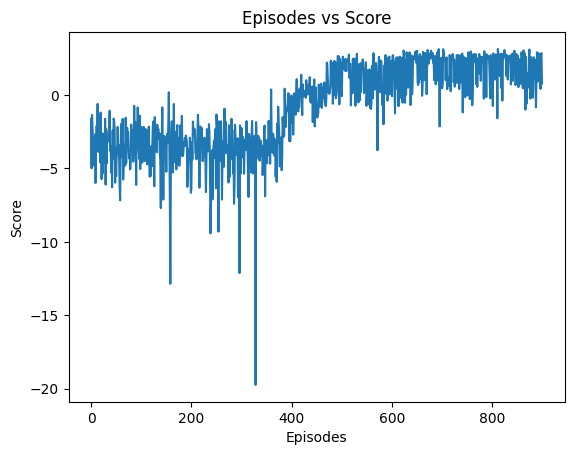

In [10]:
import matplotlib.pyplot as plt
plt.plot(score_array)
plt.title('Episodes vs Score')
plt.xlabel('Episodes')
plt.ylabel('Score')

Text(0, 0.5, 'Average Score')

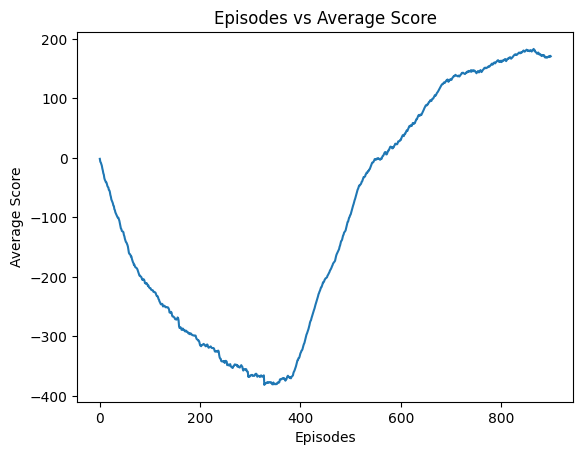

In [9]:
scaled_array = []
for avg in range(len(avg_array)):
    scaled_array.append(avg_array[avg]*100)
    
plt.plot(scaled_array)
plt.title('Episodes vs Average Score')
plt.xlabel('Episodes')
plt.ylabel('Average Score')

## REFERENCES
https://jonathan-hui.medium.com/rl-dqn-deep-q-network-e207751f7ae4
https://towardsdatascience.com/reinforcement-learning-explained-visually-part-5-deep-q-networks-step-by-step-5a5317197f4b#:~:text=The%20DQN%20works%20in%20a,and%20thus%20improve%20its%20predictions.
https://towardsdatascience.com/reinforcement-learning-explained-visually-part-4-q-learning-step-by-step-b65efb731d3e
https://medium.com/@parsa_h_m/deep-reinforcement-learning-dqn-double-dqn-dueling-dqn-noisy-dqn-and-dqn-with-prioritized-551f621a9823#:~:text=Double%20DQN%20uses%20two%20identical,computed%20with%20this%20second%20model.
https://medium.com/@parsa_h_m/deep-reinforcement-learning-dqn-double-dqn-dueling-dqn-noisy-dqn-and-dqn-with-prioritized-551f621a9823#:~:text=Double%20DQN%20uses%20two%20identical,computed%20with%20this%20second%20model
https://towardsdatascience.com/deep-deterministic-policy-gradients-explained-2d94655a9b7b
https://jonathan-hui.medium.com/rl-proximal-policy-optimization-ppo-explained-77f014ec3f12#:~:text=In%20PPO%2C%20we%20limit%20how,different%20from%20the%20current%20one.
https://www.tensorflow.org/agents/tutorials/0_intro_rl#:~:text=The%20DQN%20
https://www.techopedia.com/definition/34032/deep-q-networks
https://www.analyticsvidhya.com/blog/2019/04/introduction-deep-q-learning-python/
https://towardsdatascience.com/double-deep-q-networks-905dd8325412
https://arxiv.org/abs/1509.06461
https://medium.com/@qempsil0914/deep-q-learning-part2-double-deep-q-network-double-dqn-b8fc9212bbb2
https://towardsdatascience.com/dueling-deep-q-networks-81ffab672751
https://arxiv.org/abs/1511.06581
https://paperswithcode.com/method/dueling-network
https://arxiv.org/abs/1511.05952
https://spinningup.openai.com/en/latest/algorithms/ddpg.html#:~:text=Deep%20Deterministic%20Policy%20Gradient%20(DDPG,function%20to%20learn%20the%20policy.
https://keras.io/examples/rl/ddpg_pendulum
https://towardsdatascience.com/deep-deterministic-policy-gradient-ddpg-theory-and-implementation-747a3010e82f
https://openai.com/blog/openai-baselines-ppo/
https://arxiv.org/abs/1707.06347
https://www.geeksforgeeks.org/a-brief-introduction-to-proximal-policy-optimization/
https://paperswithcode.com/method/ppo
https://towardsdatascience.com/policy-gradients-in-a-nutshell-8b72f9743c5d
https://jonathan-hui.medium.com/rl-policy-gradients-explained-9b13b688b146
http://www.scholarpedia.org/article/Policy_gradient_methods
https://www.analyticsvidhya.com/blog/2020/11/reinforce-algorithm-taking-baby-steps-in-reinforcement-learning/#:~:text=REINFORCE%20belongs%20to%20a%20special,taking%20an%20action%20as%20output.
https://towardsdatascience.com/policy-gradient-methods-104c783251e0
http://www.cs.toronto.edu/~tingwuwang/REINFORCE.pdf
